In [35]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string
import spacy
from matplotlib.pyplot import imread
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS

In [2]:
# load the dataset
Tweet = pd.read_csv('Elon_musk.csv',encoding='Latin-1')
Tweet.drop(['Unnamed: 0'],inplace=True,axis=1)
Tweet

,Text
0,@kunalb11 Im an alien
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated
4,@teslacn Congratulations Tesla China for amazi...
...,...
1994,"@flcnhvy True, it sounds so surreal, but the n..."
1995,@PPathole Make sure to read ur terms &amp; con...
1996,@TeslaGong @PPathole Samwise Gamgee
1997,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [3]:
# Preprocessing
Tweet=[Text.strip() for Text in Tweet.Text] # remove both the leading and the trailing characters
Tweet=[Text for Text in Tweet if Text]
Tweet[0:10]

['@kunalb11 I\x92m an alien',
 '@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated',
 '@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!',
 'Happy New Year of the Ox! https://t.co/9WFKMYu2oj',
 'Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM',
 '@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :)',
 '@flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely']

In [4]:
# Joining the list into one string/text
Tweet_text=' '.join(Tweet)
Tweet_text

'@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it? @joerogan @Spotify Great interview! @gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!! Happy New Year of the Ox! https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation. The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock my account @AstroJordy <U+0001F923><U

In [5]:
# remove Twitter username handles from a given twitter text. (Removes @usernames)
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer(strip_handles=True)
Tweet_tokens=tknzr.tokenize(Tweet_text)
print(Tweet_tokens)

['I', '\x92', 'm', 'an', 'alien', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'next-level', '.', 'Have', 'you', 'tried', 'it', '?', 'Great', 'interview', '!', 'Doge', 'is', 'underestimated', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', '.', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', '!', '!', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', '!', 'https://t.co/9WFKMYu2oj', 'Frodo', 'was', 'the', 'underdoge', ',', 'All', 'thought', 'he', 'would', 'fail', ',', 'Himself', 'most', 'of', 'all', '.', 'https://t.co/zGxJFDzzrM', 'Haha', 'thanks', ':)', 'Indeed', '!', 'Tweets', 'definitely', 'do', 'not', 'represent', 'real-world', 'time', 'allocation', '.', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'https://t.co/3rWE9uHSTS', 'It', '\x92', 's', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X', ',', 'so', 'he', 'can'

In [6]:
# Again Joining the list into one string/text
Tweet_tokens_text=' '.join(Tweet_tokens)
Tweet_tokens_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is next-level . Have you tried it ? Great interview ! Doge is underestimated Congratulations Tesla China for amazing execution last year . Now on to the next for even more ! ! Happy New Year of the Ox ! https://t.co/9WFKMYu2oj Frodo was the underdoge , All thought he would fail , Himself most of all . https://t.co/zGxJFDzzrM Haha thanks :) Indeed ! Tweets definitely do not represent real-world time allocation . The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with https://t.co/3rWE9uHSTS It \x92 s getting real Bought some Dogecoin for lil X , so he can be a toddler hodler He definitely has issues , but the sentencing seems a bit high Thanks for fixing Please unlock my account <U+0001F923> <U+0001F923> This is true power haha https://t.co/Fc9uhQSd7O Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT : NASA has selected Falcon Heavy to 

In [7]:
# Remove Punctuations 
no_punc_text=Tweet_tokens_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is nextlevel  Have you tried it  Great interview  Doge is underestimated Congratulations Tesla China for amazing execution last year  Now on to the next for even more   Happy New Year of the Ox  httpstco9WFKMYu2oj Frodo was the underdoge  All thought he would fail  Himself most of all  httpstcozGxJFDzzrM Haha thanks  Indeed  Tweets definitely do not represent realworld time allocation  The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with httpstco3rWE9uHSTS It \x92 s getting real Bought some Dogecoin for lil X  so he can be a toddler hodler He definitely has issues  but the sentencing seems a bit high Thanks for fixing Please unlock my account U0001F923 U0001F923 This is true power haha httpstcoFc9uhQSd7O Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT  NASA has selected Falcon Heavy to launch the first two elements of the lunar Ga

In [8]:
# remove https or url within text
import re
no_url_text=re.sub(r'http\S+', '', no_punc_text)
no_url_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is nextlevel  Have you tried it  Great interview  Doge is underestimated Congratulations Tesla China for amazing execution last year  Now on to the next for even more   Happy New Year of the Ox   Frodo was the underdoge  All thought he would fail  Himself most of all   Haha thanks  Indeed  Tweets definitely do not represent realworld time allocation  The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with  It \x92 s getting real Bought some Dogecoin for lil X  so he can be a toddler hodler He definitely has issues  but the sentencing seems a bit high Thanks for fixing Please unlock my account U0001F923 U0001F923 This is true power haha  Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT  NASA has selected Falcon Heavy to launch the first two elements of the lunar Gateway together on one mission   Yes Once we can predict cash flow reason

In [9]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lavanya\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [10]:
from nltk.tokenize import word_tokenize
text_tokens=word_tokenize(no_url_text)
print(text_tokens)

['I', '\x92', 'm', 'an', 'alien', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'nextlevel', 'Have', 'you', 'tried', 'it', 'Great', 'interview', 'Doge', 'is', 'underestimated', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', 'Frodo', 'was', 'the', 'underdoge', 'All', 'thought', 'he', 'would', 'fail', 'Himself', 'most', 'of', 'all', 'Haha', 'thanks', 'Indeed', 'Tweets', 'definitely', 'do', 'not', 'represent', 'realworld', 'time', 'allocation', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'It', '\x92', 's', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X', 'so', 'he', 'can', 'be', 'a', 'toddler', 'hodler', 'He', 'definitely', 'has', 'issues', 'but', 'the', 'sentencing', 'seems', 'a', 'bit', 'high', 'Thanks', 'for', 'fixing',

In [11]:
# Tokenization
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lavanya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [12]:
# Tokens count
len(text_tokens)

17847

In [13]:
# Remove Stopwords
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list = ['\x92','rt','ye','yeah','haha','Yes','U0001F923','I']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['alien', 'Ray', 'tracing', 'Cyberpunk', 'HDR', 'nextlevel', 'Have', 'tried', 'Great', 'interview', 'Doge', 'underestimated', 'Congratulations', 'Tesla', 'China', 'amazing', 'execution', 'last', 'year', 'Now', 'next', 'even', 'Happy', 'New', 'Year', 'Ox', 'Frodo', 'underdoge', 'All', 'thought', 'would', 'fail', 'Himself', 'Haha', 'thanks', 'Indeed', 'Tweets', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'The', 'entertaining', 'outcome', 'likely', 'Just', 'sent', 'Just', 'agree', 'Clubhouse', 'It', 'getting', 'real', 'Bought', 'Dogecoin', 'lil', 'X', 'toddler', 'hodler', 'He', 'definitely', 'issues', 'sentencing', 'seems', 'bit', 'high', 'Thanks', 'fixing', 'Please', 'unlock', 'account', 'This', 'true', 'power', 'Any', 'crypto', 'wallet', 'give', 'private', 'keys', 'avoided', 'costs', 'Your', 'app', 'sucks', 'RT', 'NASA', 'selected', 'Falcon', 'Heavy', 'launch', 'first', 'two', 'elements', 'lunar', 'Gateway', 'together', 'one', 'mission', 'Once', 'predict', 'cash', 'flo

In [14]:
# Normalize the data
lower_words=[Text.lower() for Text in no_stop_tokens]
print(lower_words[100:200])

['once', 'predict', 'cash', 'flow', 'reasonably', 'well', 'starlink', 'ipo', 'starlink', 'staggeringly', 'difficult', 'technical', 'economic', 'endeavor', 'however', 'spacex', 'needs', 'pass', 'deep', 'chasm', 'negative', 'cash', 'flow', 'next', 'year', 'lowest', 'cost', 'per', 'ton', 'carbon', 'sequestered', 'net', 'value', 'product', 'made', 'must', 'scalable', 'g', 'it', 'meant', 'price', 'countries', 'only', 'difference', 'taxes', 'shipping', 'this', 'intended', 'earth', 'may', 'ideas', 'apply', 'mars', 'xprize', 'team', 'manage', '100m', 'carbon', 'capture', 'prize', 'everyone', 'tesla', 'receives', 'stock', 'my', 'comp', 'stock', 'options', 'take', 'table', 'that', 'missing', 'back', 'work', 'go', 'does', 'seem', 'bit', 'high', 'doge', 'appears', 'inflationary', 'meaningfully', 'fixed', 'coins', 'per', 'unit', 'time', 'whereas', 'wow', '1', 'orbital', 'launch', 'tower', 'stack', '2', 'enough', 'raptors', 'orbit', 'booster']


In [15]:
# Stemming (Optional)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens[100:200])

['onc', 'predict', 'cash', 'flow', 'reason', 'well', 'starlink', 'ipo', 'starlink', 'staggeringli', 'difficult', 'technic', 'econom', 'endeavor', 'howev', 'spacex', 'need', 'pass', 'deep', 'chasm', 'neg', 'cash', 'flow', 'next', 'year', 'lowest', 'cost', 'per', 'ton', 'carbon', 'sequest', 'net', 'valu', 'product', 'made', 'must', 'scalabl', 'g', 'it', 'meant', 'price', 'countri', 'onli', 'differ', 'tax', 'ship', 'thi', 'intend', 'earth', 'may', 'idea', 'appli', 'mar', 'xprize', 'team', 'manag', '100m', 'carbon', 'captur', 'prize', 'everyon', 'tesla', 'receiv', 'stock', 'my', 'comp', 'stock', 'option', 'take', 'tabl', 'that', 'miss', 'back', 'work', 'go', 'doe', 'seem', 'bit', 'high', 'doge', 'appear', 'inflationari', 'meaning', 'fix', 'coin', 'per', 'unit', 'time', 'wherea', 'wow', '1', 'orbit', 'launch', 'tower', 'stack', '2', 'enough', 'raptor', 'orbit', 'booster']


In [16]:
!pip3 install en_core_web_sm
!python -m spacy download en

[!] As of spaCy v3.0, shortcuts like 'en' are deprecated. Please use the full
pipeline package name 'en_core_web_sm' instead.
[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [17]:
# Lemmatization
import spacy
from spacy.lang.en.examples import sentences
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

alien ray tracing cyberpunk hdr nextlevel have tried great interview doge underestimated congratulations tesla china amazing execution last year now next even happy new year ox frodo underdoge all thought would fail himself haha thanks indeed tweets definitely represent realworld time allocation the entertaining outcome likely just sent just agree clubhouse it getting real bought dogecoin lil x toddler hodler he definitely issues sentencing seems bit high thanks fixing please unlock account this true power any crypto wallet give private keys avoided costs your app sucks rt nasa selected falcon heavy launch first two elements lunar gateway together one mission once predict cash flow reasonably well starlink ipo starlink staggeringly difficult technical economic endeavor however spacex needs pass deep chasm negative cash flow next year lowest cost per ton carbon sequestered net value product made must scalable g it meant price countries only difference taxes shipping this intended earth 

In [18]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['alien', 'ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'have', 'try', 'great', 'interview', 'doge', 'underestimated', 'congratulation', 'tesla', 'china', 'amazing', 'execution', 'last', 'year', 'now', 'next', 'even', 'happy', 'new', 'year', 'ox', 'frodo', 'underdoge', 'all', 'thought', 'would', 'fail', 'himself', 'haha', 'thank', 'indeed', 'tweet', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'the', 'entertaining', 'outcome', 'likely', 'just', 'send', 'just', 'agree', 'clubhouse', 'it', 'get', 'real', 'buy', 'dogecoin', 'lil', 'x', 'toddler', 'hodler', 'he', 'definitely', 'issue', 'sentencing', 'seem', 'bit', 'high', 'thank', 'fix', 'please', 'unlock', 'account', 'this', 'true', 'power', 'any', 'crypto', 'wallet', 'give', 'private', 'key', 'avoid', 'cost', 'your', 'app', 'suck', 'rt', 'nasa', 'select', 'falcon', 'heavy', 'launch', 'first', 'two', 'element', 'lunar', 'gateway', 'together', 'one', 'mission', 'once', 'predict', 'cash', 'flow', 'reasonably', 'well', 's

In [121]:
clean_Tweet=' '.join(lemmas)
clean_Tweet

'alien ray trace cyberpunk hdr nextlevel have try great interview doge underestimated congratulation tesla china amazing execution last year now next even happy new year ox frodo underdoge all thought would fail himself haha thank indeed tweet definitely represent realworld time allocation the entertaining outcome likely just send just agree clubhouse it get real buy dogecoin lil x toddler hodler he definitely issue sentencing seem bit high thank fix please unlock account this true power any crypto wallet give private key avoid cost your app suck rt nasa select falcon heavy launch first two element lunar gateway together one mission once predict cash flow reasonably well starlink ipo starlink staggeringly difficult technical economic endeavor however spacex need pass deep chasm negative cash flow next year low cost per ton carbon sequester net value product make must scalable g it mean price country only difference taxis ship this intend earth may idea apply mar xprize team manage 100 

# Feature Extaction


# 1. Using CountVectorizer

In [20]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
Tweetcv=cv.fit_transform(lemmas)

In [21]:
print(cv.vocabulary_)

{'alien': 194, 'ray': 2354, 'trace': 3019, 'cyberpunk': 768, 'hdr': 1361, 'nextlevel': 1965, 'have': 1356, 'try': 3050, 'great': 1309, 'interview': 1560, 'doge': 893, 'underestimated': 3184, 'congratulation': 675, 'tesla': 2927, 'china': 585, 'amazing': 216, 'execution': 1060, 'last': 1645, 'year': 3404, 'now': 1993, 'next': 1964, 'even': 1034, 'happy': 1343, 'new': 1962, 'ox': 2094, 'frodo': 1211, 'underdoge': 3183, 'all': 196, 'thought': 2963, 'would': 3390, 'fail': 1094, 'himself': 1404, 'haha': 1332, 'thank': 2937, 'indeed': 1501, 'tweet': 3065, 'definitely': 806, 'represent': 2421, 'realworld': 2369, 'time': 2979, 'allocation': 198, 'the': 2942, 'entertaining': 1004, 'outcome': 2073, 'likely': 1700, 'just': 1602, 'send': 2563, 'agree': 179, 'clubhouse': 614, 'it': 1579, 'get': 1270, 'real': 2364, 'buy': 503, 'dogecoin': 895, 'lil': 1701, 'toddler': 2990, 'hodler': 1410, 'he': 1362, 'issue': 1578, 'sentencing': 2567, 'seem': 2555, 'bit': 419, 'high': 1396, 'fix': 1156, 'please': 21

In [22]:
print(cv.get_feature_names()[100:400])

['74', '78', '7th', '90', '9007', '922', '948', '95', '99', 'aber', 'able', 'abo', 'aboard', 'abort', 'about', 'above', 'absence', 'absolute', 'absolutely', 'absorb', 'absorption', 'absurd', 'absurdly', 'ac', 'academia', 'accel', 'accelera', 'accelerate', 'acceleration', 'accelerator', 'accept', 'acceptable', 'access', 'accessible', 'accident', 'accidental', 'accommodate', 'account', 'accura', 'accuracy', 'accurate', 'ace', 'achieve', 'achievement', 'achy', 'acquisition', 'across', 'action', 'active', 'activity', 'actual', 'actuall', 'actually', 'actuary', 'adagio', 'add', 'additive', 'address', 'administer', 'adult', 'advanc', 'advance', 'advanced', 'advantage', 'adventure', 'advertise', 'advice', 'advise', 'aero', 'afb', 'affair', 'affect', 'affordable', 'africa', 'after', 'afternoon', 'age', 'ago', 'agony', 'agree', 'ah', 'ahead', 'ahem', 'ai', 'aim', 'air', 'aircraft', 'airplane', 'ak', 'aka', 'alert', 'alexander', 'algo', 'algorithm', 'alien', 'align', 'all', 'allocati', 'allocati

In [23]:
print(Tweetcv.toarray()[100:400])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [24]:
print(Tweetcv.toarray().shape)

(11486, 3424)


# 2. CountVectorizer with N-grams (Bigrams & Trigrams)

In [25]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [26]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['actually', 'ai', 'also', 'back', 'big', 'booster', 'car', 'come', 'complete', 'cool', 'could', 'crew', 'day', 'design', 'do', 'dragon', 'earth', 'engine', 'even', 'ever', 'exactly', 'falcon', 'first', 'flight', 'fsd', 'future', 'get', 'go', 'good', 'great', 'haha', 'hard', 'high', 'if', 'it', 'just', 'land', 'launch', 'life', 'like', 'look', 'lot', 'make', 'many', 'maybe', 'mission', 'model', 'month', 'much', 'need', 'new', 'next', 'no', 'not', 'one', 'part', 'people', 'point', 'pretty', 'probably', 'production', 'right', 'rocket', 'rt', 'say', 'seem', 'soon', 'space', 'spacex', 'starlink', 'starship', 'start', 'still', 'super', 'sure', 'take', 'tesla', 'test', 'thank', 'that', 'the', 'there', 'they', 'think', 'this', 'time', 'true', 'try', 'ufe0f', 'use', 'way', 'we', 'week', 'well', 'will', 'work', 'would', 'yeah', 'year', 'you']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


# 3. TF-IDF Vectorizer

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [28]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matix_ngram.toarray())

['10', '100', '13', '20', '2020', '30', '300', '40', '4d', '60', 'able', 'absolutely', 'access', 'accurate', 'actually', 'add', 'after', 'ago', 'agree', 'ai', 'aim', 'air', 'all', 'almost', 'already', 'also', 'although', 'always', 'amazing', 'and', 'another', 'appear', 'apply', 'appreciate', 'approval', 'arm', 'around', 'article', 'as', 'astronaut', 'at', 'autopilot', 'awesome', 'back', 'bad', 'bar', 'base', 'battery', 'be', 'become', 'berlin', 'beta', 'big', 'bit', 'boca', 'body', 'booster', 'brain', 'build', 'burn', 'but', 'buy', 'cake', 'call', 'camera', 'can', 'car', 'cargo', 'catch', 'cell', 'ch4', 'chance', 'change', 'china', 'civilization', 'close', 'cold', 'color', 'come', 'company', 'complete', 'computer', 'confirm', 'congratulation', 'control', 'cool', 'cost', 'could', 'course', 'cov', 'crazy', 'create', 'crew', 'critical', 'curevac', 'cyberpunk', 'cybertruck', 'datum', 'day', 'deep', 'definitely', 'delivery', 'design', 'detail', 'difference', 'different', 'do', 'dock', 'doge

# Word Cloud

In [29]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

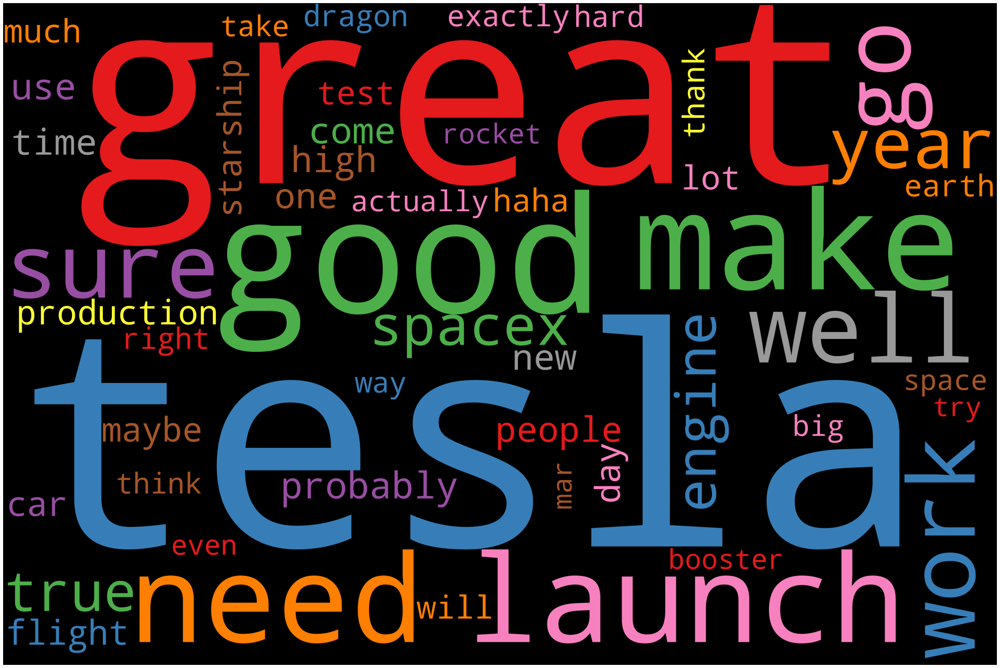

In [30]:
# Generate Word Cloud
STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=50,
                   colormap='Set1',stopwords=STOPWORDS).generate(clean_Tweet)
plot_cloud(wordcloud)

In [122]:
# Part of speech  Tagging

nlp = spacy.load("en_core_web_sm")
one_block = clean_Tweet
doc_block = nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)


In [123]:
for token in doc_block:
    print(token, token.pos_)

alien PROPN
ray NOUN
trace NOUN
cyberpunk NOUN
hdr NOUN
nextlevel NOUN
have AUX
try VERB
great ADJ
interview NOUN
doge PROPN
underestimated VERB
congratulation NOUN
tesla NOUN
china PROPN
amazing ADJ
execution NOUN
last ADJ
year NOUN
now ADV
next ADV
even ADV
happy ADJ
new ADJ
year NOUN
ox NOUN
frodo NOUN
underdoge ADJ
all DET
thought NOUN
would AUX
fail VERB
himself PRON
haha INTJ
thank VERB
indeed ADV
tweet PROPN
definitely ADV
represent VERB
realworld PROPN
time PROPN
allocation NOUN
the DET
entertaining ADJ
outcome NOUN
likely ADV
just ADV
send VERB
just ADV
agree VERB
clubhouse NOUN
it PRON
get VERB
real ADJ
buy NOUN
dogecoin NOUN
lil NOUN
x PUNCT
toddler NOUN
hodler NOUN
he PRON
definitely ADV
issue VERB
sentencing NOUN
seem VERB
bit NOUN
high ADJ
thank NOUN
fix NOUN
please INTJ
unlock VERB
account NOUN
this DET
true ADJ
power NOUN
any DET
crypto NOUN
wallet NOUN
give VERB
private ADJ
key ADJ
avoid NOUN
cost VERB
your PRON
app NOUN
suck PROPN
rt PROPN
nasa PROPN
select PROPN
falc

huge ADJ
thank NOUN
make VERB
possible ADJ
um INTJ
giant ADJ
fusion NOUN
reactor NOUN
sky NOUN
work NOUN
maintenance NOUN
tesla NOUN
full ADJ
selfdrive ADJ
work NOUN
safety NOUN
level NOUN
well INTJ
average ADJ
driver NOUN
year NOUN
dojo NOUN
need AUX
make VERB
selfdrive ADJ
well ADV
it PRON
enough ADV
safe ADJ
human ADJ
driver NOUN
aut NOUN
ignore VERB
head VERB
great ADJ
interview NOUN
mathia PROPN
döpfner PROPN
u0001f3a9 PROPN
the DET
great ADJ
gatsby NOUN
u0001f3a9 ADJ
inspire VERB
ballet NOUN
rocket NOUN
motion NOUN
primarily ADV
vertical ADJ
want VERB
top NOUN
open ADJ
let VERB
make VERB
roaring NOUN
20 NUM
might AUX
lump VERB
along ADV
way NOUN
production NOUN
hard ADJ
prototype NOUN
easy ADJ
building NOUN
1000 NUM
starship NOUN
create VERB
exactly ADV
haha PROPN
sn9 PROPN
press PROPN
ch4 NOUN
header NOUN
tank NOUN
helium NOUN
longterm NOUN
solution NOUN
debate NOUN
leg NOUN
would AUX
certainly ADV
work VERB
good ADJ
part NOUN
part NOUN
good ADJ
step NOUN
step NOUN
save VERB
mas

memory NOUN
sn8 NOUN
rt PROPN
photo NOUN
starship NOUN
sn8 NOUN
flight NOUN
test NOUN
u2192 PROPN
exactly ADV
woohoo VERB
sn8 PROPN
great ADJ
even ADV
reach VERB
apogee PROPN
would AUX
great ADJ
control NOUN
way NOUN
put VERB
thank VERB
south ADJ
texas PROPN
support VERB
this DET
gateway NOUN
mar PROPN
life NOUN
universe VERB
everything PRON
yeah INTJ
engine NOUN
great PROPN
mar PROPN
come VERB
fuel NOUN
header NOUN
tank NOUN
pressure NOUN
low ADJ
landing NOUN
burn NOUN
cause VERB
touchdown NOUN
velocity NOUN
high ADJ
rud PROPN
get VERB
successful ADJ
ascent NOUN
switchover NOUN
header NOUN
tank NOUN
precise ADJ
flap NOUN
control NOUN
landing NOUN
point NOUN
u0001f920 ADV
nearorbital ADJ
space NOUN
fast ADJ
way NOUN
travel VERB
long ADJ
distance NOUN
earth NOUN
it PRON
call VERB
space NOUN
 PROPN
station NOUN
 PUNCT
actually ADV
move VERB
around ADP
earth NOUN
25 NUM
time NOUN
spee NOUN
rt PROPN
timelapse PROPN
dragon PROPN
approach PROPN
 PROPN
two NUM
dragon NOUN
dock NOUN
 VERB


we PRON
buff PROPN
be AUX
get VERB
wildly ADV
different ADJ
result NOUN
different ADJ
lab NOUN
likely ADV
moderate ADJ
case NOUN
covid ADJ
npcs PROPN
way NOUN
ahem NOUN
unless SCONJ
dmt ADJ
law NOUN
thermodynamic ADJ
1 NUM
you PRON
win VERB
2 NUM
you PRON
break VERB
even ADV
3 NUM
you PRON
stop VERB
play VERB
shake NOUN
fist NOUN
entropy PROPN
big ADJ
expansion NOUN
beta NOUN
program NOUN
6 NUM
8 NUM
week NOUN
interesting ADJ
my PRON
thursday PROPN
night NOUN
saliva NOUN
sample NOUN
come VERB
back ADV
today NOUN
n1 PROPN
gene NOUN
unique ADJ
cov NOUN
what PRON
honey NOUN
feel VERB
way NOUN
this PRON
seem VERB
accurate ADJ
cold ADJ
symptom NOUN
go VERB
u0001f600 ADV
u0001f680 VERB
u0001f4ab ADJ
there PRON
degree NOUN
pos PROPN
heneghan PROPN
make VERB
lot NOUN
sense NOUN
hilarious ADJ
clarify NOUN
r NOUN
the DET
number NOUN
pcr PROPN
amplification NOUN
cycle NOUN
require VERB
detect NOUN
virus PROPN
rough ADJ
indicator NOUN
vir VERB
this DET
great ADJ
reference NOUN
worth ADJ
read VERB


bugs PROPN
code PROPN
london PROPN
beijing PROPN
would AUX
cool VERB
wow INTJ
would AUX
quite ADV
trip VERB
that SCONJ
kid NOUN
møtør NOUN
trèndé NOUN
look VERB
like ADP
snoopy ADJ
current ADJ
production NOUN
slightly ADV
well ADV
doesn PROPN
seem VERB
life NOUN
solar ADJ
system NOUN
maybe ADV
ice NOUN
europa NOUN
rt PROPN
tesla PROPN
model NOUN
3 NUM
sr PROPN
have VERB
low ADJ
energy NOUN
consumption NOUN
all DET
bevs NOUN
say VERB
report NOUN
very ADV
creative ADJ
that SCONJ
free ADJ
fusion NOUN
reactor NOUN
sky NOUN
conveniently ADV
convert VERB
4 NUM
million NUM
ton NOUN
mass NOUN
energy NOUN
every DET
second NOUN
you PRON
never ADV
know VERB
after ADP
u0001f622 PROPN
also ADV
system NOUN
autodelete NOUN
old ADJ
datum NOUN
automatically ADV
default VERB
table NOUN
tension NOUN
start VERB
production NOUN
7 NUM
seater NOUN
next ADJ
month NOUN
initial ADJ
delivery NOUN
early ADJ
december PROPN
the DET
gauntlet PROPN
throw VERB
the DET
prophecy NOUN
fulfil NOUN
model NOUN
s PART
price 

price NOUN
model NOUN
3 NUM
25k NOUN
refer VERB
future ADJ
car NOUN
small ADJ
model NOUN
3 NUM
what PRON
heavy ADJ
duty NOUN
paintball PROPN
machine PROPN
gun PROPN
mount PROPN
bed PROPN
rail PROPN
new ADJ
version NOUN
come VERB
soon ADV
supplier NOUN
we PRON
high ADJ
energy NOUN
nickel NOUN
least ADJ
also ADV
maybe ADV
presenta VERB
checking NOUN
totally ADV
head VERB
tesla NOUN
delivery NOUN
center NOUN
near ADV
maybe ADV
help VERB
new ADJ
owner NOUN
would AUX
cool VERB
completely ADV
agree VERB
flap NOUN
directly ADV
drive VERB
electric ADJ
motor NOUN
gearbox NOUN
no DET
hydraulic ADJ
thank NOUN
tesla NOUN
team NOUN
great ADJ
work NOUN
delivery NOUN
for ADP
new ADJ
owner NOUN
super ADV
appreciate VERB
accommodate VERB
us PRON
delivery NOUN
ti NOUN
there ADV
time NOUN
feel VERB
like ADP
living NOUN
dilbert NOUN
cartoon NOUN
that PRON
specie NOUN
stand VERB
test NOUN
time NOUN
mostly ADV
304l PROPN
301 NUM
break NOUN
301 NUM
304 NUM
interface NOUN
sn9 NOUN
8 NUM
bar NOUN
differential 

engineer NOUN
working PROPN
edison PROPN
lab NOUN
apply VERB
work NOUN
ahem NOUN
start VERB
soon ADV
 ADP
all DET
physics NOUN
either CCONJ
impossible ADJ
trivial ADJ
it PRON
impossible ADJ
understand NOUN
become VERB
trivial ADJ
 PROPN
e PROPN
rutherford PROPN
giant ADJ
gap NOUN
experimental ADJ
medical ADJ
device NOUN
use VERB
patient ADJ
extreme ADJ
medical ADJ
problem NOUN
wid VERB
test NOUN
short ADJ
rvac PROPN
skirt NOUN
go VERB
well ADV
full ADJ
length NOUN
skirt NOUN
test NOUN
come VERB
soon ADV
neuralink NOUN
product NOUN
demo NOUN
3 NUM
hour NOUN
webcast NOUN
raptor NOUN
reach VERB
230 NUM
mtf NOUN
half NOUN
million NUM
pound NOUN
thrust NOUN
peak NOUN
pressure NOUN
wit NOUN
good ADJ
chance NOUN
something PRON
slip VERB
sunday PROPN
intense ADJ
only ADV
need VERB
2 NUM
engine NOUN
bore NOUN
co NOUN
tunnel NOUN
vegas PROPN
month NOUN
operational ADJ
neuralink NOUN
month NOUN
tesla NOUN
next ADJ
month NOUN
spacex ADV
probably ADV
october PROPN
we PRON
make VERB
lot NOUN
progr

high ADJ
altitude NOUN
body NOUN
flap NOUN
soon ADV
v1 PROPN
1 NUM
leg NOUN
60 NUM
long ADJ
v2 PROPN
0 NUM
leg NOUN
much ADV
wide ADJ
tall ADJ
 NOUN
like INTJ
falcon NOUN
bu ADP
progress NOUN
accelerate VERB
rt PROPN
launch PROPN
starship PROPN
sn5 PROPN
launch NOUN
150 NUM
meter NOUN
test NOUN
hop PROPN
spacex ADP
boca PROPN
chica PROPN
under ADP
power NOUN
raptor NOUN
sn27 PROPN
sn5 NOUN
h PROPN
exactly ADV
mar PROPN
look VERB
real ADV
possible ADJ
flight NOUN
3 NUM
min NOUN
most ADV
likely ADV
true ADJ
highly ADV
likely ADJ
road NOUN
true ADJ
fact NOUN
scrub NOUN
day NOUN
a DET
raptor NOUN
turbopump NOUN
spin NOUN
start NOUN
valve VERB
open ADJ
trigger NOUN
automatic ADJ
abo NOUN
boca PROPN
control NOUN
room NOUN
hop NOUN
attempt VERB
33 NUM
minute NOUN
rt NOUN
 PROPN
we PRON
go VERB
go VERB
moon NOUN
go VERB
base NOUN
moon NOUN
go NOUN
send VERB
people NOUN
mar PROPN
make VERB
for ADP
sure ADJ
tbh PRON
must AUX
confess VERB
occasionally ADV
pontificate VERB
highconcept NOUN
thing

u0001f525 ADJ
u0001f525 NOUN
progress NOUN
update NOUN
august PROPN
28 NUM


In [124]:
#filtering for nouns and verbs only 
noun_verb = [token.text for token in doc_block if  token.pos_ in  ('NOUN', 'VERB')]
print(noun_verb)

['ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'try', 'interview', 'underestimated', 'congratulation', 'tesla', 'execution', 'year', 'year', 'ox', 'frodo', 'thought', 'fail', 'thank', 'represent', 'allocation', 'outcome', 'send', 'agree', 'clubhouse', 'get', 'buy', 'dogecoin', 'lil', 'toddler', 'hodler', 'issue', 'sentencing', 'seem', 'bit', 'thank', 'fix', 'unlock', 'account', 'power', 'crypto', 'wallet', 'give', 'avoid', 'cost', 'app', 'launch', 'element', 'gateway', 'mission', 'predict', 'cash', 'flow', 'starlink', 'starlink', 'endeavor', 'pass', 'chasm', 'cash', 'flow', 'year', 'cost', 'ton', 'carbon', 'sequester', 'value', 'product', 'make', 'scalable', 'mean', 'price', 'country', 'difference', 'taxis', 'ship', 'intend', 'earth', 'idea', 'apply', 'xprize', 'team', 'manage', 'carbon', 'capture', 'prize', 'tesla', 'receive', 'stock', 'comp', 'stock', 'option', 'take', 'table', 'miss', 'work', 'go', 'seem', 'bit', 'appear', 'fix', 'coin', 'unit', 'time', 'launch', 'tower', 'stack'

In [125]:
#counting tokens again
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

X = cv.fit_transform(noun_verb)
sum_words = X.sum(axis=0)
words_frequency = [(word,sum_words[0,idx]) for word, idx in cv.vocabulary_.items()]
words_frequency = sorted(words_frequency,key = lambda x: x[1],reverse=True)
wf_df = pd.DataFrame(words_frequency)
wf_df.columns = ['word', 'count']

wf_df

,word,count
0,tesla,89
1,make,64
2,launch,54
3,year,48
4,go,48
...,...,...
1957,propaganda,1
1958,click,1
1959,gamgee,1
1960,altho,1


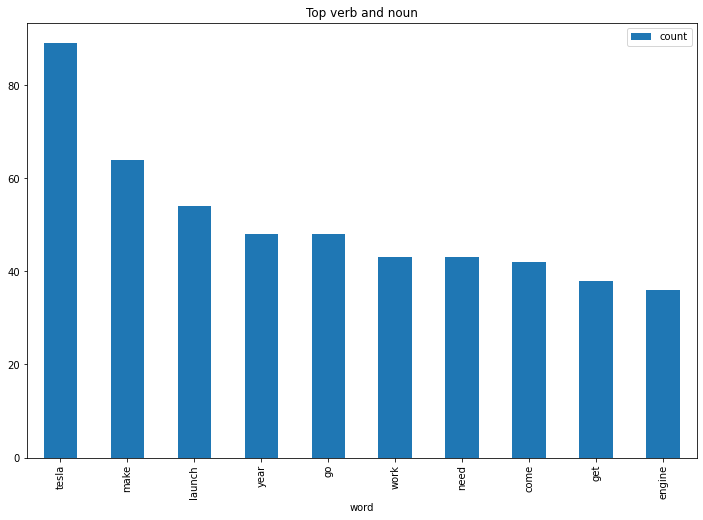

In [126]:
#Visualizing results
# Barchart for top 10 nouns + verbs
wf_df[0:10].plot.bar(x='word',figsize = (12,8),title='Top verb and noun')
plt.show()

# Emotion Mining - sentiment analysis

In [55]:
from nltk import tokenize
sentence = tokenize.sent_tokenize(' '.join(Tweet))
sentence

['@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level.',
 'Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year.',
 'Now on to the next for even more!!',
 'Happy New Year of the Ox!',
 'https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all.',
 'https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed!',
 'Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock 

In [56]:
sent_dataframe = pd.DataFrame(sentence,columns=['sentence'])
sent_dataframe

,sentence
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...
1,Have you tried it?
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated @teslacn Congr...
4,Now on to the next for even more!!
...,...
919,"@kenyanwalstreet Not actually a payout, just a..."
920,"It may never pay out, as the stock cant b ht..."
921,Details Aug 28.
922,AI symbiosis while u wait @vistacruiser7 @flcn...


In [60]:
!pip install afinn 

  Created wheel for afinn: filename=afinn-0.1-py3-none-any.whl size=53448 sha256=2381a5500b6cd687e3799b48ac602039107ebe3eaba30d52b1a4c55841a9e73f
  Stored in directory: c:\users\lavanya\appdata\local\pip\cache\wheels\79\91\ee\8374d9bc8c6c0896a2db75afdfd63d43653902407a0e76cd94
Successfully built afinn


In [127]:
# Emotion Lexican - Affin
affin = pd.read_csv('Afinn.csv',sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [128]:
affinity_score = affin.set_index('word')['value'].to_dict()
affinity_score

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [132]:
# Custom function: score each word in a sentence in lemmatised form, but calculate the score for the whole original sentence
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_score

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [133]:
# test that it works
calculate_sentiment(text = 'amazing')

4

In [134]:
sent_dataframe['sentiment_value'] = sent_dataframe['sentence'].apply(calculate_sentiment)

In [135]:
# how many words are in the sentence?
sent_dataframe['word_count'] = sent_dataframe['sentence'].str.split().apply(len)
sent_dataframe['word_count']

0      13
1       4
2       4
3      13
4       8
       ..
919    11
920    31
921     3
922    47
923    15
Name: word_count, Length: 924, dtype: int64

In [136]:
sent_dataframe.sort_values(by='sentiment_value')

,sentence,sentiment_value,word_count,index
837,Cool Model 3 review by @iamjamiefoxx https://t...,-8,61,837
647,Very ba https://t.co/tJsh1Exz1Q @justpaulinel...,-8,60,647
64,"Also, the road to hell is mostly paved with ba...",-7,11,64
920,"It may never pay out, as the stock cant b ht...",-4,31,920
611,"Then static fire, checkouts, static fire, fly ...",-4,12,611
...,...,...,...,...
645,Its https://t.co/IxhyT6NuiC @Teslarati Tesla...,13,65,645
585,The open areas https://t.co/rabjKrtQlw @Sav...,14,138,585
36,"@ajtourville @Erdayastronaut @SpaceX Yes, but ...",15,231,36
105,@Erdayastronaut @SpaceX Was also thinking that...,16,94,105


In [137]:
# Sentiment score of the whole review
sent_dataframe['sentiment_value'].describe()

count    924.000000
mean       1.312771
std        2.647718
min       -8.000000
25%        0.000000
50%        0.000000
75%        3.000000
max       17.000000
Name: sentiment_value, dtype: float64

In [138]:
# negative Sentiment score of the whole review
sent_dataframe[sent_dataframe['sentiment_value']<=0]

,sentence,sentiment_value,word_count,index
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,0,13,0
1,Have you tried it?,0,4,1
4,Now on to the next for even more!!,0,8,4
5,Happy New Year of the Ox!,0,6,5
6,https://t.co/9WFKMYu2oj Frodo was the underdog...,-2,14,6
...,...,...,...,...
919,"@kenyanwalstreet Not actually a payout, just a...",0,11,919
920,"It may never pay out, as the stock cant b ht...",-4,31,920
921,Details Aug 28.,0,3,921
922,AI symbiosis while u wait @vistacruiser7 @flcn...,-2,47,922


In [139]:
# positive sentiment score of the whole review
sent_dataframe[sent_dataframe['sentiment_value']>0]

,sentence,sentiment_value,word_count,index
2,@joerogan @Spotify Great interview!,3,4,2
3,@gtera27 Doge is underestimated @teslacn Congr...,3,13,3
7,https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy ...,2,10,7
9,The most entertaining outcome is the most like...,3,109,9
17,Back to work I go @CapybaraSurfer @MattWallace...,4,38,17
...,...,...,...,...
911,He was one of the very best.,3,7,911
913,"@Ali_Afshari In general, we need to improve ho...",4,87,913
915,"@burakaydik True Wow, IHOP &amp; GitHub are cl...",7,15,915
917,This is both great &amp; terrifying.,3,6,917


In [140]:
# Adding index cloumn
sent_dataframe['index']=range(0,len(sent_dataframe))
sent_dataframe

,sentence,sentiment_value,word_count,index
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,0,13,0
1,Have you tried it?,0,4,1
2,@joerogan @Spotify Great interview!,3,4,2
3,@gtera27 Doge is underestimated @teslacn Congr...,3,13,3
4,Now on to the next for even more!!,0,8,4
...,...,...,...,...
919,"@kenyanwalstreet Not actually a payout, just a...",0,11,919
920,"It may never pay out, as the stock cant b ht...",-4,31,920
921,Details Aug 28.,0,3,921
922,AI symbiosis while u wait @vistacruiser7 @flcn...,-2,47,922


C:\Users\lavanya\anaconda\anaconda1\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


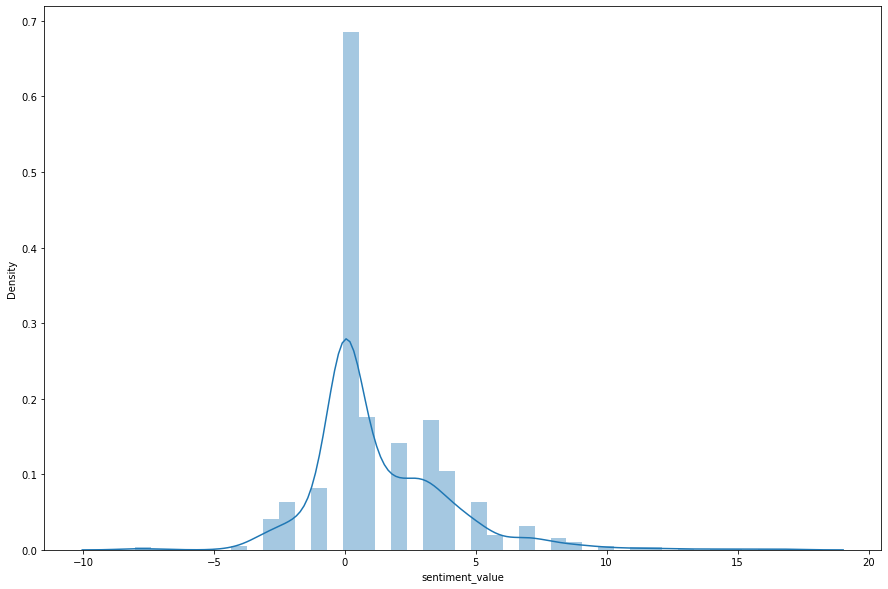

In [141]:
# Plotting the sentiment value for whole review
import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(sent_dataframe['sentiment_value'])
None

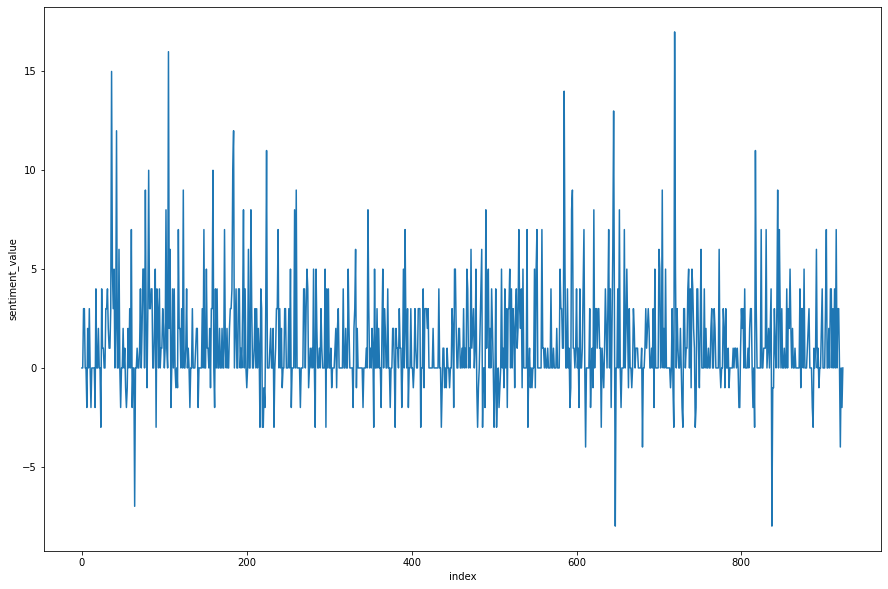

In [142]:
# Plotting the line plot for sentiment value of whole review
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_dataframe)
plt.show()

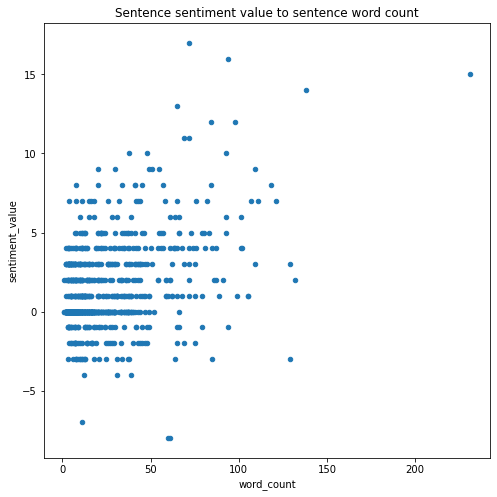

In [143]:
# Correlation analysis
sent_dataframe.plot.scatter(x='word_count',y='sentiment_value',figsize=(8,8),title='Sentence sentiment value to sentence word count')
None

In [146]:
!pip install plotly
import plotly.express as px 

In [147]:
fig = px.bar(sent_dataframe[:20], x='word_count', y='sentiment_value', title='Counts of top bigrams', template='plotly_white', labels={'ngram': 'Bigram', 'count': 'Count'})
fig.show()

In [148]:
fig = px.treemap(sent_dataframe, title='Treemap chart by companies and whether complaint mentions credit report.',
                 path=['word_count','sentiment_value'], color='sentence', color_continuous_scale=px.colors.sequential.GnBu)
fig.show()

In [149]:
fig = px.bar(sent_dataframe, x='word_count', y='sentiment_value', template='plotly_white', orientation='h',
             labels={'portion': '% of Complaints', 'bigram': 'Bigram', 'company': 'Company'},
             color='sentence', color_discrete_sequence=px.colors.qualitative.Safe)
fig.update_layout(font=dict(size=10, color='DarkSlateGray'))
fig.update_layout(width=1200, height=500)
fig.show()

In [150]:
fig = px.bar(sent_dataframe,  x='word_count', y='sentiment_value'
             , color='sentence', template='plotly_white', color_discrete_sequence=px.colors.qualitative.Bold
             , labels={'word_count', 'sentiment_value'})
fig.update_layout(legend_orientation="h")
fig.update_layout(legend=dict(x=0.1, y=1.1))
fig.update_yaxes(title='', showticklabels=False)
fig.show()

# Text Scrapping of Amazon

In [114]:
import requests
from bs4 import BeautifulSoup

In [115]:
def get_soup(url):
    r = requests.get(url)
    soup = BeautifulSoup(r.text, 'html.parser')
    return soup

In [116]:
review_list = []
def get_reviews(soup):
    reviews = soup.find_all('div', {'data-hook': 'review'})
    try:
        for i in reviews:
            review  = i.find('span', {'data-hook': 'review-body'}).text.strip()    
            review_list.append(review)
    except:
        pass

In [117]:
for x in range(1,400):
    soup = get_soup(f'https://www.amazon.in/OnePlus-Bullets-Wireless-Bass-Black/product-reviews/B092ZJVB6Z/ref=cm_cr_getr_d_paging_btm_next_383?ie=UTF8&reviewerType=all_reviews&pageNumber={x}')
    get_reviews(soup)
    print(len(review_list))
    if not soup.find('li', {'class': 'a-disabled a-last'}):
        pass
    else:
        break

10
20
30
40
50
60
70
80
80
90
100
110
120
130
140
140
150
160
170
180
190
190
190
200
210
220
230
230
240
240
250
260
270
280
290
300
300
310
320
320
330
340
350
360
370
380
380
390
400
410
420
430
430
440
450
450
460
470
480
490
500
510
520
530
540
540
550
550
560
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
860
870
880
890
900
910
920
920
930
930
930
940
950
960
970
970
980
990
1000
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1100
1100
1110
1120
1130
1140
1150
1150
1160
1170
1180
1190
1200
1210
1220
1220
1230
1230
1240
1250
1260
1270
1280
1290
1300
1310
1310
1320
1330
1330
1340
1340
1350
1360
1370
1380
1390
1390
1400
1410
1420
1420
1420
1430
1440
1440
1450
1460
1470
1480
1490
1500
1510
1520
1530
1530
1530
1540
1550
1560
1570
1580
1590
1600
1610
1620
1630
1640
1650
1660
1670
1680
1690
1700
1710
1720
1720
1730
1740
1750
1760
1770
1780
1790
1800
1800
1810
1820
1830
1840
1850
1860
1870
1880
1880

KeyboardInterrupt: 

In [118]:
import pandas as pd

df = pd.DataFrame(review_list, columns = ['Reviews'])
df

,Reviews
0,I am using this neck band about past 12 days a...
1,Overall a good earphone but not a good soundin...
2,I received package but in box I got a broken d...
3,"In the previous model, we could easily switch ..."
4,"Built - good built as expected, band is soft s..."
...,...
2745,The media could not be loaded.
2746,Having good storage capacity
2747,Good product
2748,"If u have one plus, then only purchase or else..."


In [119]:
df.to_csv('Amazon_reviews.csv', index = False)